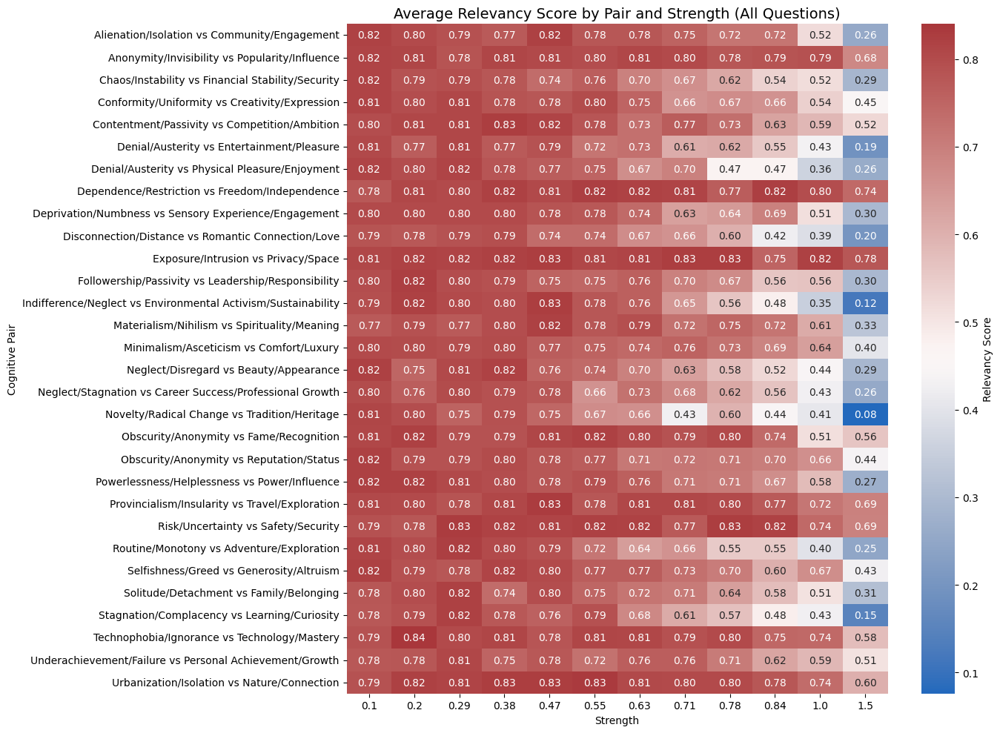

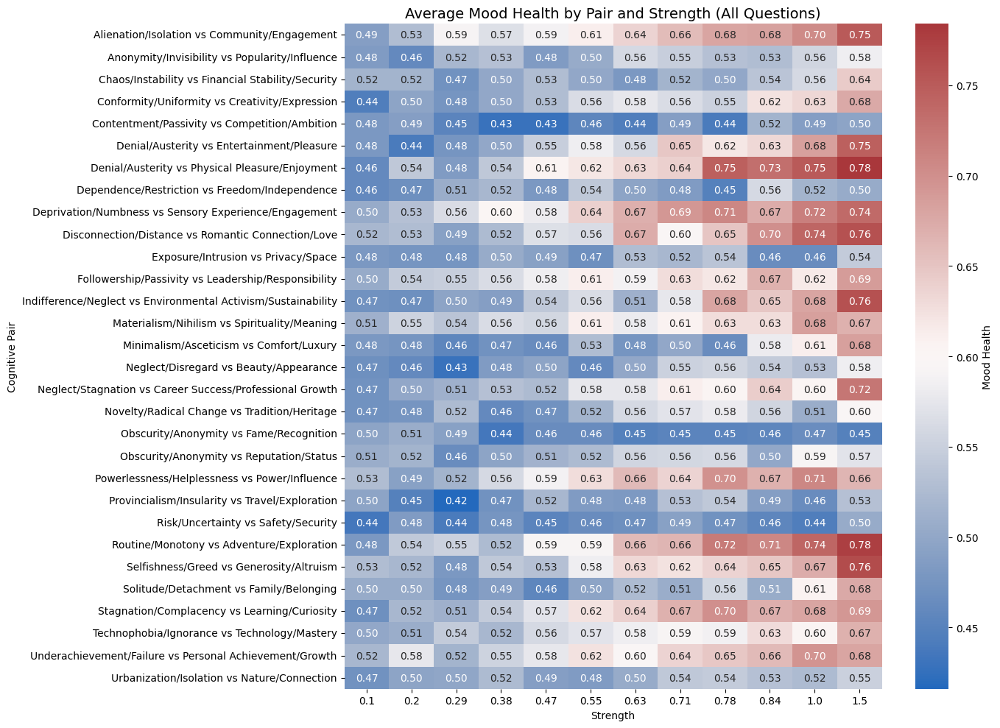

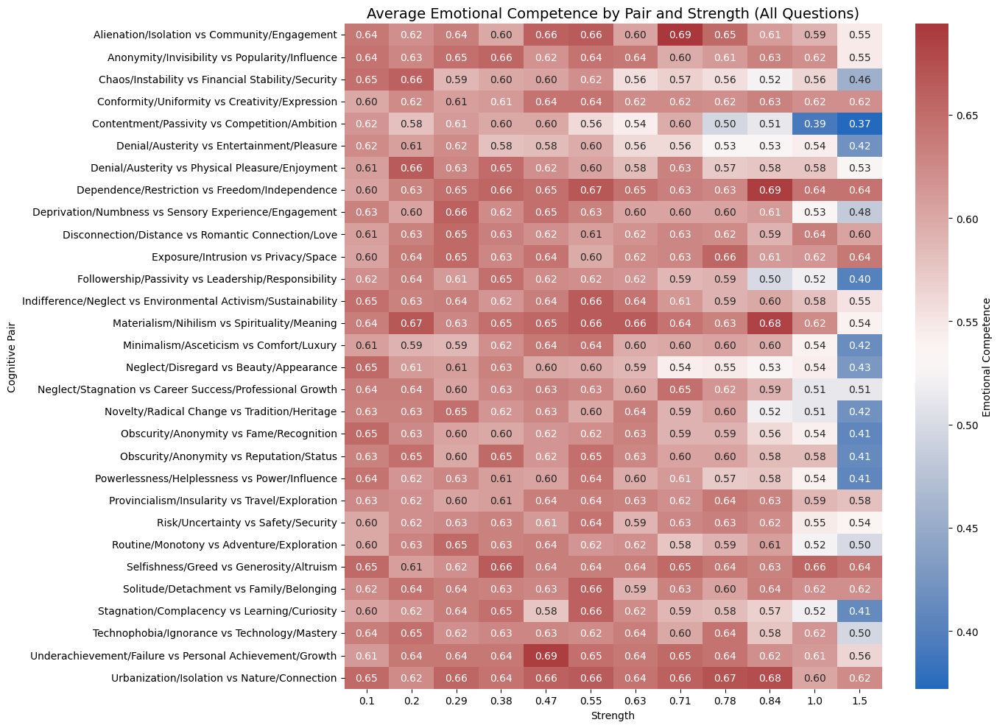

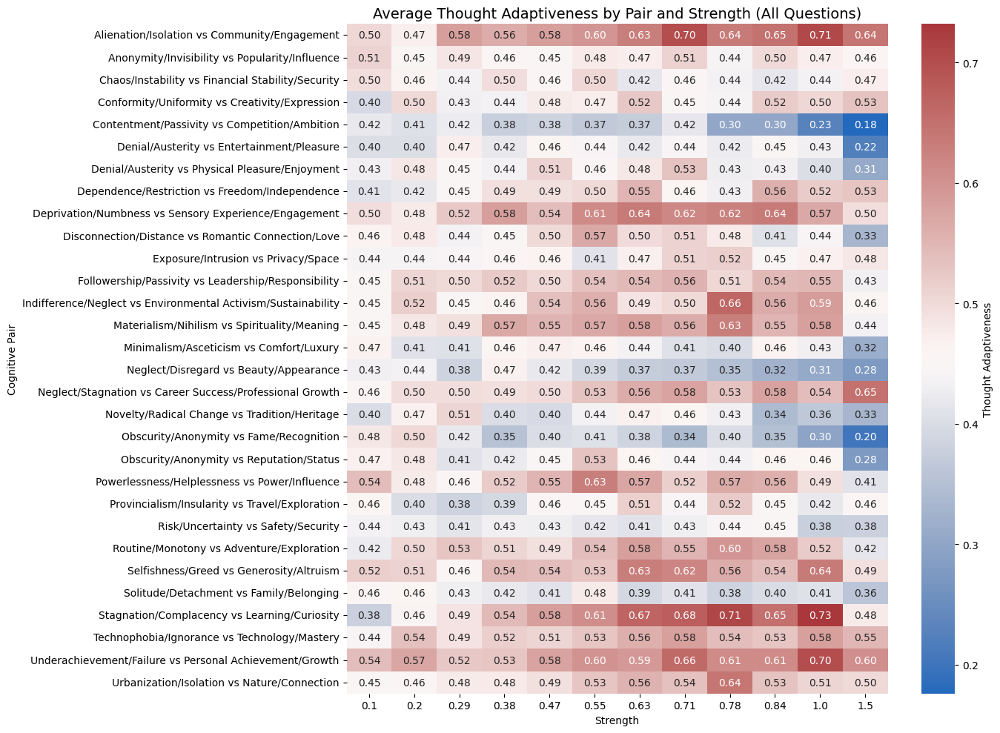

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ── 1. Load data ───────────────────────────────────────────────────────────────
file_path = Path("/home/koalacrown/Desktop/Code/Projects/LLM_threapy/LLM_agumented_therapy/Cogexp/Valence/cognitive_experiment_results007_big_with_questions_eval_local.xlsx")
df = pd.read_excel(file_path)

# ── 2. Metrics to visualise ────────────────────────────────────────────────────
metrics = [
    "relevancy_score",
    "mood_health",
    "emotional_competence",
    "thought_adaptiveness",
]

# ── 3. Make a heat‑map per metric ──────────────────────────────────────────────
plt.style.use("default")           # keep matplotlib’s default style
figsize = (14, 10)                 # same size as your valence plot
cmap = "vlag"                      # diverging palette

for metric in metrics:
    pivot = df.pivot_table(
        index="pair",
        columns="strength",
        values=metric,
        aggfunc="mean",
    )

    plt.figure(figsize=figsize)
    sns.heatmap(
        pivot,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        cbar_kws={"label": metric.replace("_", " ").title()},
    )
    plt.title(
        f"Average {metric.replace('_', ' ').title()} by Pair and Strength (All Questions)",
        fontsize=14,
    )
    plt.xlabel("Strength")
    plt.ylabel("Cognitive Pair")
    plt.tight_layout()
    plt.show()


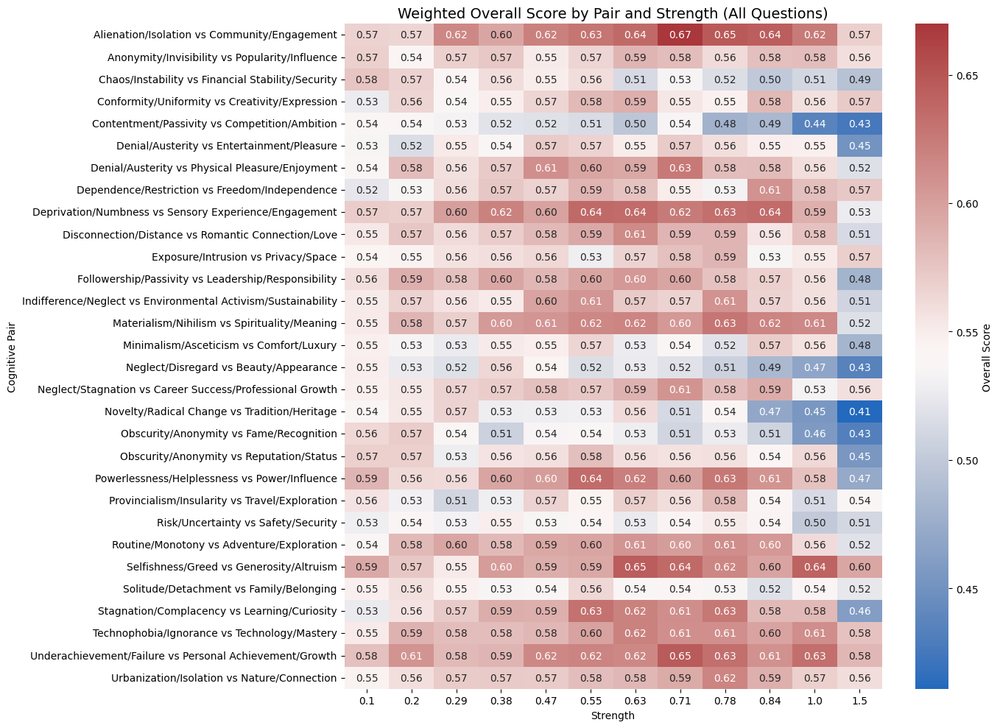

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ── 1. Load data ───────────────────────────────────────────────────────────────
file_path = Path("/home/koalacrown/Desktop/Code/Projects/LLM_threapy/LLM_agumented_therapy/Cogexp/Valence/cognitive_experiment_results007_big_with_questions_eval_local.xlsx")
df = pd.read_excel(file_path)

# ── 2. Compute weighted overall score ──────────────────────────────────────────
weights = {
    "valence_intensity": 1.0,
    "relevancy_score": 1.0,
    "mood_health": 1.0,
    "emotional_competence": 1.0,
    "thought_adaptiveness": 1.0,
}
total_w = sum(weights.values())

df["overall_score"] = (
    df["valence_intensity"]   * weights["valence_intensity"]
  + df["relevancy_score"]     * weights["relevancy_score"]
  + df["mood_health"]         * weights["mood_health"]
  + df["emotional_competence"]* weights["emotional_competence"]
  + df["thought_adaptiveness"]* weights["thought_adaptiveness"]
) / total_w

# ── 3. Pivot and visualise ─────────────────────────────────────────────────────
pivot = df.pivot_table(
    index="pair",
    columns="strength",
    values="overall_score",
    aggfunc="mean",
)

plt.figure(figsize=(14, 10))
sns.heatmap(
    pivot,
    annot=True,
    fmt=".2f",
    cmap="vlag",
    cbar_kws={"label": "Overall Score"},
)
plt.title("Weighted Overall Score by Pair and Strength (All Questions)", fontsize=14)
plt.xlabel("Strength")
plt.ylabel("Cognitive Pair")
plt.tight_layout()
plt.show()


In [2]:
import pandas as pd
import plotly.express as px
from pathlib import Path

# ── 1. Load data ───────────────────────────────────────────────────────────────
file_path = Path(
    "/Users/ivanculo/Desktop/Projects/Faks/LLM_agumented_therapy/Cogexp/Valence/Data/cognitive_experiment_results007_big_with_questions_eval_local.xlsx"
)
df = pd.read_excel(file_path)

# ── 2. (Re‑)compute the weighted overall score if needed ───────────────────────
if "overall_score" not in df.columns:
    weights = {
        "valence_intensity": 1,
        "relevancy_score": 0.7,
        "mood_health": 1.0,
        "emotional_competence": 1.0,
        "thought_adaptiveness": 1.0,
    }
    total_w = sum(weights.values())
    df["overall_score"] = (
        df["valence_intensity"]    * weights["valence_intensity"]
        + df["relevancy_score"]    * weights["relevancy_score"]
        + df["mood_health"]        * weights["mood_health"]
        + df["emotional_competence"]* weights["emotional_competence"]
        + df["thought_adaptiveness"]* weights["thought_adaptiveness"]
    ) / total_w

# ── 3. Metrics to visualise ────────────────────────────────────────────────────
metrics = [
    "valence_intensity",
    "relevancy_score",
    "mood_health",
    "emotional_competence",
    "thought_adaptiveness",
    "overall_score",
]

# Nice readable template
template = "plotly_white"

for metric in metrics:
    nice_name = metric.replace("_", " ").title()

    # ── 4‑a  Scatter + OLS regression per pair ────────────────────────────────
    fig_reg = px.scatter(
        df,
        x="strength",
        y=metric,
        color="pair",
        trendline="ols",           # one line per colour group
        template=template,
        title=f"{nice_name} vs Strength — Regression Lines by Pair",
        labels={"strength": "Strength", metric: nice_name},
    )
    # slightly smaller markers for clarity
    fig_reg.update_traces(marker=dict(size=7, opacity=0.75), selector=dict(mode="markers"))
    fig_reg.update_layout(legend_title_text="Pair")

    # open in browser (tab) — change to .write_html if you prefer files
    fig_reg.show()
    fig_reg.write_html('/Users/ivanculo/Desktop/Projects/Faks/LLM_agumented_therapy/Cogexp/Valence/figures/fig_reg.html')
    # ── 4‑b  Mean line per pair ────────────────────────────────────────────────
    mean_df = (
        df.groupby(["pair", "strength"])[metric]
        .mean()
        .reset_index()
        .sort_values("strength")
    )

    fig_line = px.line(
        mean_df,
        x="strength",
        y=metric,
        color="pair",
        markers=True,
        template=template,
        title=f"{nice_name} vs Strength — Mean Lines by Pair",
        labels={"strength": "Strength", metric: nice_name},
    )
    fig_line.update_traces(line=dict(width=3))
    fig_line.update_layout(legend_title_text="Pair")

    fig_line.show()

print("All interactive charts generated — check your browser tabs!")


All interactive charts generated — check your browser tabs!


## Final Pairs

In [5]:
import pandas as pd
import plotly.express as px
from pathlib import Path

# ── 1. Load data ───────────────────────────────────────────────────────────────
file_path = Path(
    "/Users/ivanculo/Desktop/Projects/Faks/LLM_agumented_therapy/Cogexp/Valence/Data/"
    "cognitive_experiment_results007_big_with_questions_eval_local.xlsx"
)
df = pd.read_excel(file_path)

# ── 2. Re-compute overall_score (if needed) ──────────────────────────────────
if "overall_score" not in df:
    weights = {
        "valence_intensity": 1,
        "relevancy_score": 0.7,
        "mood_health": 1.0,
        "emotional_competence": 1.0,
        "thought_adaptiveness": 1.0,
    }
    total_w = sum(weights.values())
    df["overall_score"] = (
        df["valence_intensity"]    * weights["valence_intensity"]
      + df["relevancy_score"]     * weights["relevancy_score"]
      + df["mood_health"]         * weights["mood_health"]
      + df["emotional_competence"]* weights["emotional_competence"]
      + df["thought_adaptiveness"]* weights["thought_adaptiveness"]
    ) / total_w

# ── 3. Filter to just the five pairs ──────────────────────────────────────────
selected_pairs = [
    "Selfishness/Greed vs Generosity/Altruism",
    "Neglect/Disregard vs Beauty/Appearance",
    "Materialism/Nihilism vs Spirituality/Meaning",
    "Contentment/Passivity vs Competition/Ambition",
    "Obscurity/Anonymity vs Fame/Recognition",
    "Alienation/Isolation vs Community/Engagement"
]
df_sub = df[df["pair"].isin(selected_pairs)].copy()

# ── 4. Plot overall_score vs strength ─────────────────────────────────────────
template = "plotly_white"
metric = "overall_score"
nice_name = "Overall Score"

# 4-a) Scatter + OLS regression
fig_reg = px.scatter(
    df_sub,
    x="strength",
    y=metric,
    color="pair",
    trendline="ols",
    template=template,
    title=f"{nice_name} vs Strength — Regression by Pair",
    labels={"strength": "Strength", metric: nice_name},
)
fig_reg.update_traces(marker=dict(size=7, opacity=0.75), selector=dict(mode="markers"))
fig_reg.update_layout(legend_title_text="Pair")
fig_reg.show()
# → optionally: fig_reg.write_html("fig_overall_regression.html")

# 4-b) Mean‐line per pair
mean_df = (
    df_sub
    .groupby(["pair", "strength"])[metric]
    .mean()
    .reset_index()
    .sort_values("strength")
)
fig_line = px.line(
    mean_df,
    x="strength",
    y=metric,
    color="pair",
    markers=True,
    template=template,
    title=f"{nice_name} vs Strength — Mean Lines by Pair",
    labels={"strength": "Strength", metric: nice_name},
)
fig_line.update_traces(line=dict(width=3))
fig_line.update_layout(legend_title_text="Pair")
fig_line.show()
# → optionally save with: fig_line.write_html("fig_overall_meanline.html")

print("Done! Two charts: one with regression lines, one with mean trends.")

Done! Two charts: one with regression lines, one with mean trends.


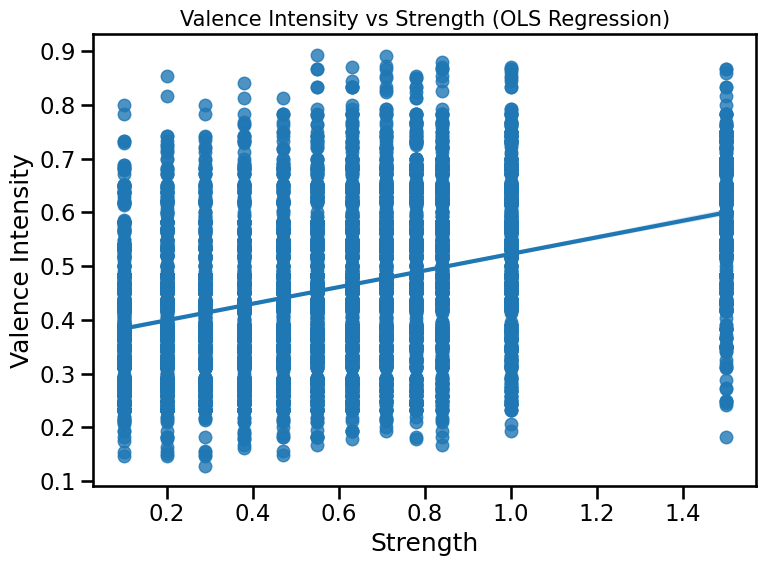

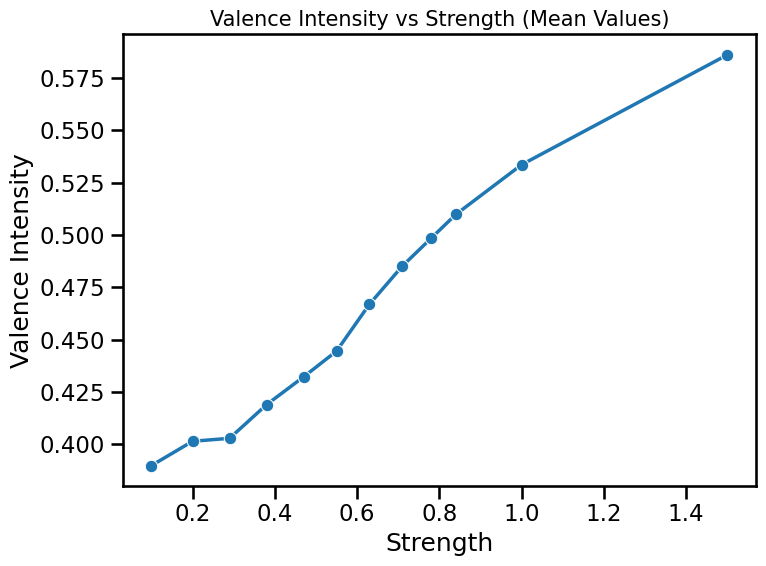

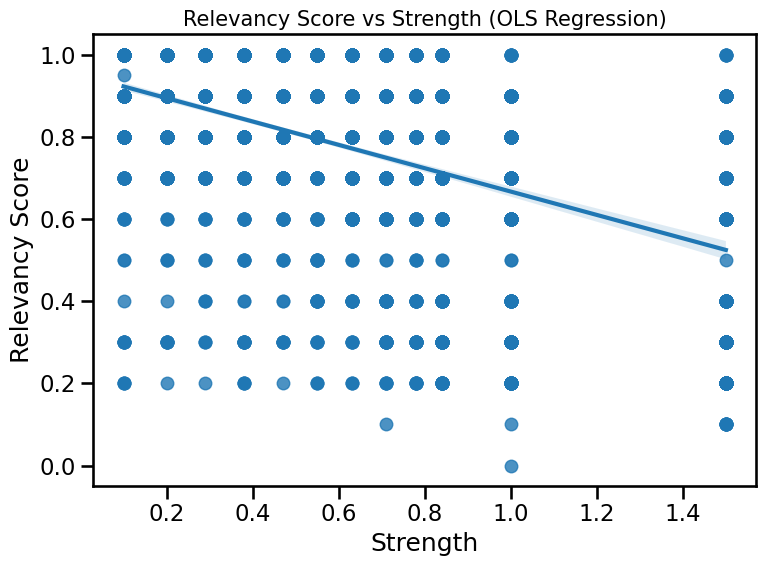

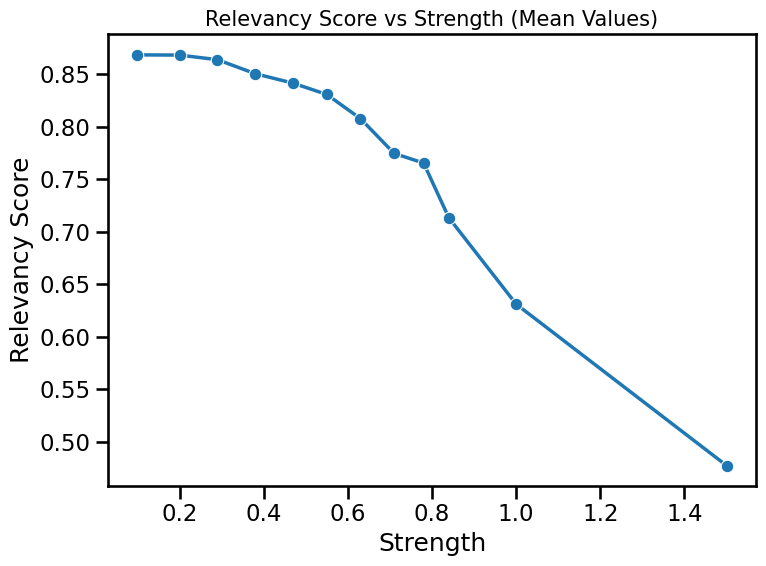

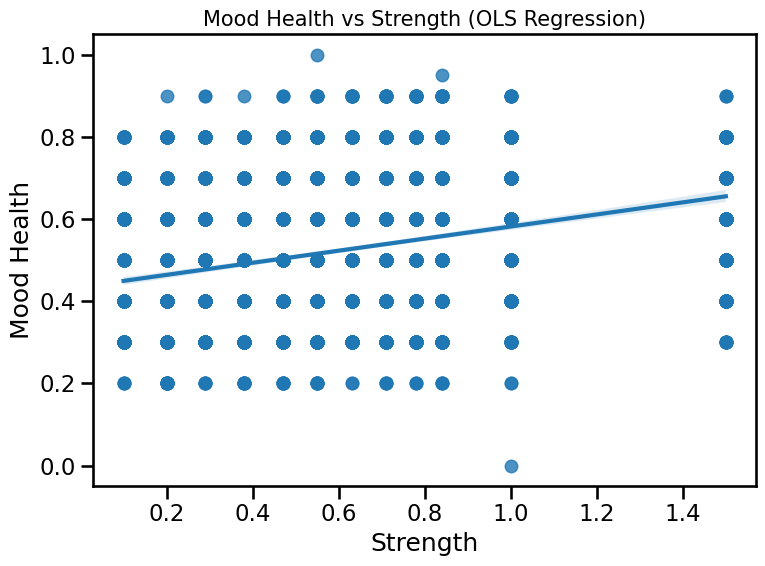

...

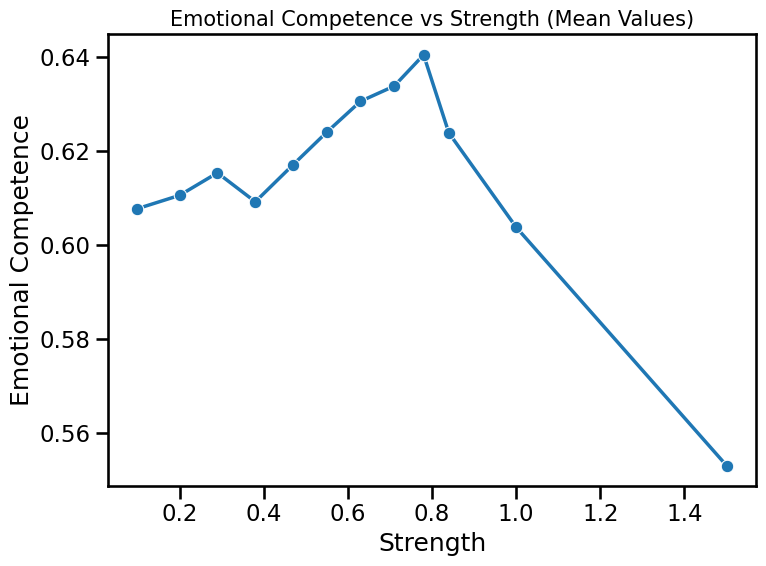

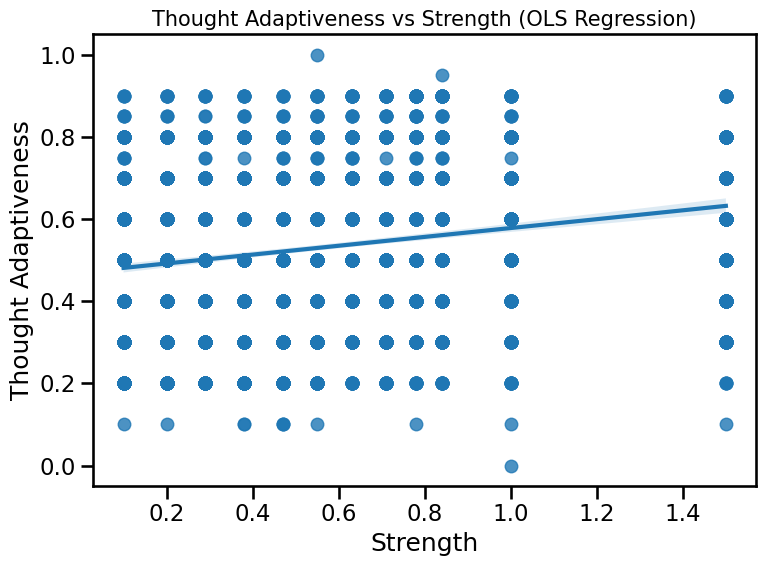

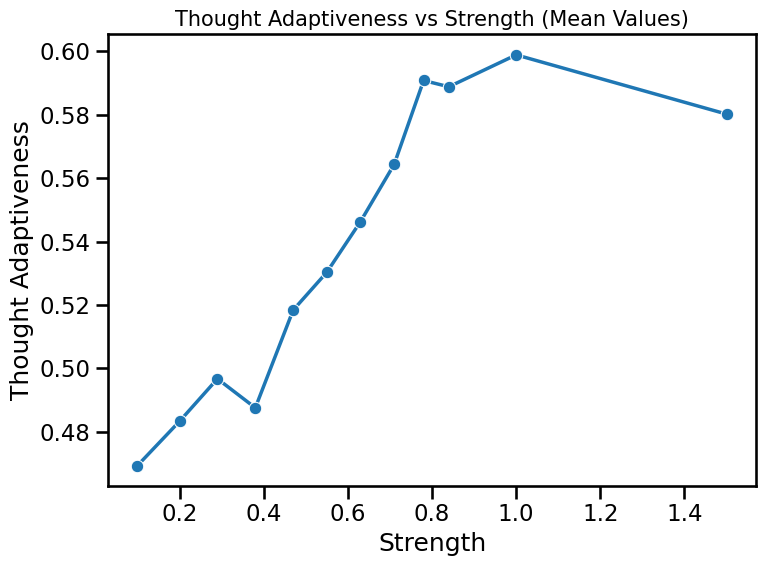

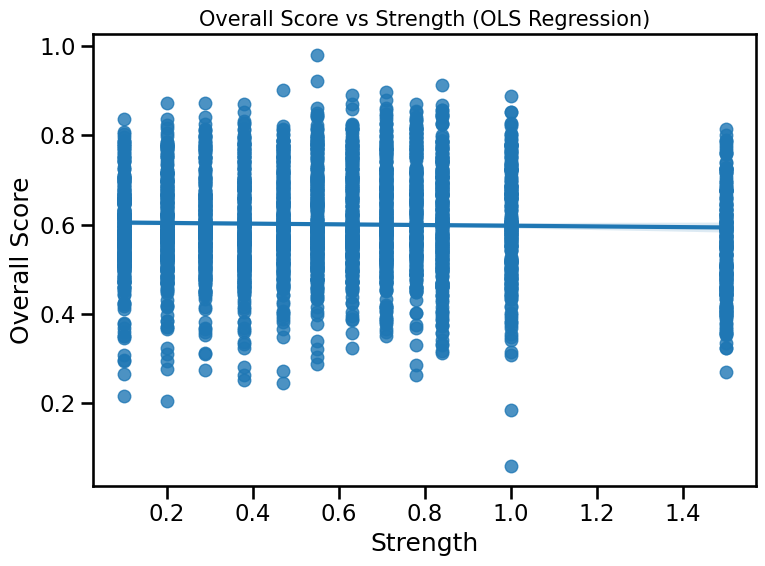

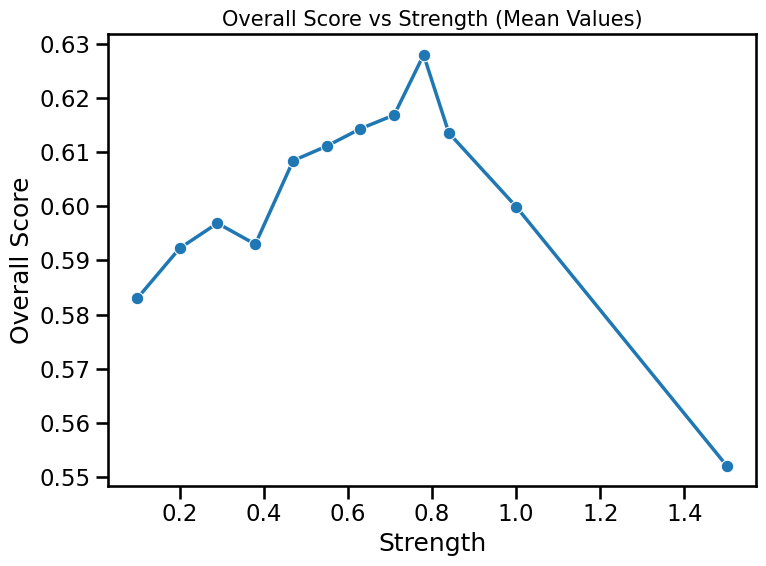

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ── 1. Load data ───────────────────────────────────────────────────────────────
file_path = Path(
    "/home/koalacrown/Desktop/Code/Projects/LLM_threapy/LLM_agumented_therapy/Cogexp/Valence/cognitive_experiment_results007_big_with_questions_evaluated.xlsx"
)
df = pd.read_excel(file_path)

# ── 2. If you haven’t run the weight step yet, compute overall_score here ──────
if "overall_score" not in df.columns:
    weights = {
        "valence_intensity": 1.0,
        "relevancy_score": 1.5,
        "mood_health": 1.0,
        "emotional_competence": 1.0,
        "thought_adaptiveness": 1.0,
    }
    total_w = sum(weights.values())
    df["overall_score"] = (
        df["valence_intensity"]   * weights["valence_intensity"]
      + df["relevancy_score"]     * weights["relevancy_score"]
      + df["mood_health"]         * weights["mood_health"]
      + df["emotional_competence"]* weights["emotional_competence"]
      + df["thought_adaptiveness"]* weights["thought_adaptiveness"]
    ) / total_w

# ── 3. Metrics to plot ─────────────────────────────────────────────────────────
metrics = [
    "valence_intensity",
    "relevancy_score",
    "mood_health",
    "emotional_competence",
    "thought_adaptiveness",
    "overall_score",
]

plt.style.use("default")          # keep default style
figsize = (8, 6)                  # a bit smaller than heat‑maps
sns.set_context("talk")           # slightly larger font

# ── 4. Loop through metrics and create two plots each ──────────────────────────
for metric in metrics:
    nice_name = metric.replace("_", " ").title()

    # 4‑a — Regression plot (scatter + OLS line)
    plt.figure(figsize=figsize)
    sns.regplot(
        data=df,
        x="strength",
        y=metric,
        scatter=True,
        ci=95,          # 95 % confidence band
        line_kws={"linewidth": 3},
    )
    plt.title(f"{nice_name} vs Strength (OLS Regression)", fontsize=15)
    plt.xlabel("Strength")
    plt.ylabel(nice_name)
    plt.tight_layout()
    plt.show()

    # 4‑b — Mean line plot across strength levels
    means = df.groupby("strength")[metric].mean().reset_index()

    plt.figure(figsize=figsize)
    sns.lineplot(
        data=means,
        x="strength",
        y=metric,
        marker="o",
        linewidth=2.5,
    )
    plt.title(f"{nice_name} vs Strength (Mean Values)", fontsize=15)
    plt.xlabel("Strength")
    plt.ylabel(nice_name)
    plt.tight_layout()
    plt.show()


<Figure size 900x600 with 0 Axes>

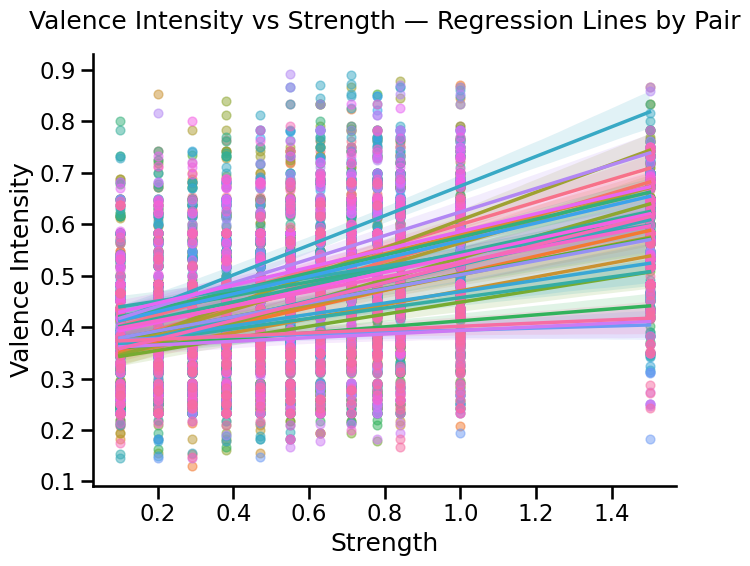

/tmp/ipykernel_49884/2904382795.py:93: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


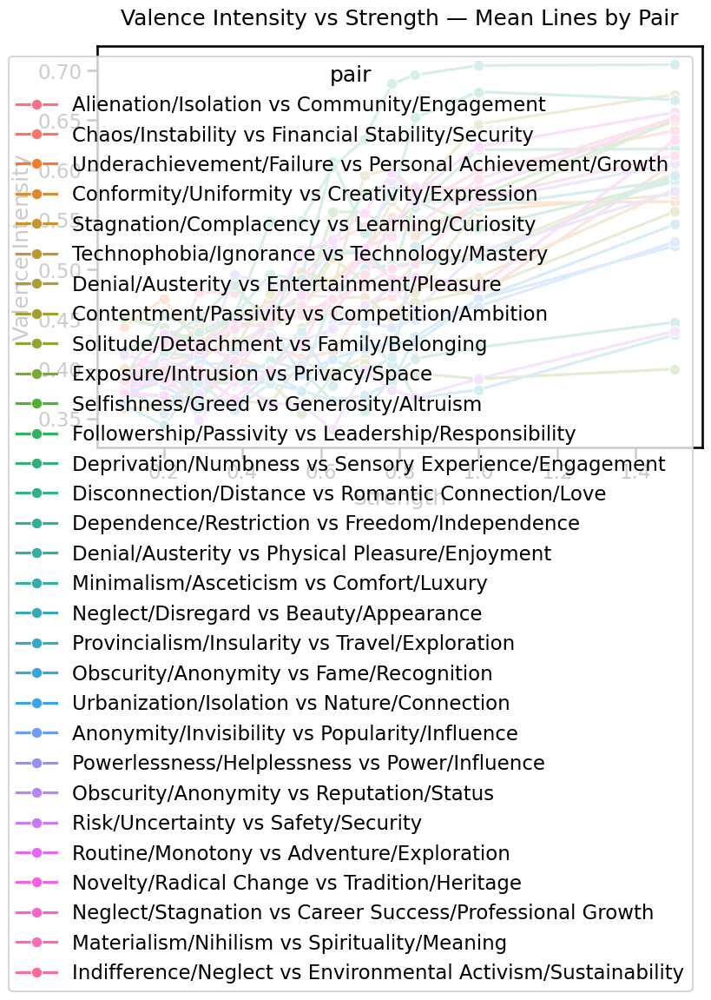

<Figure size 900x600 with 0 Axes>

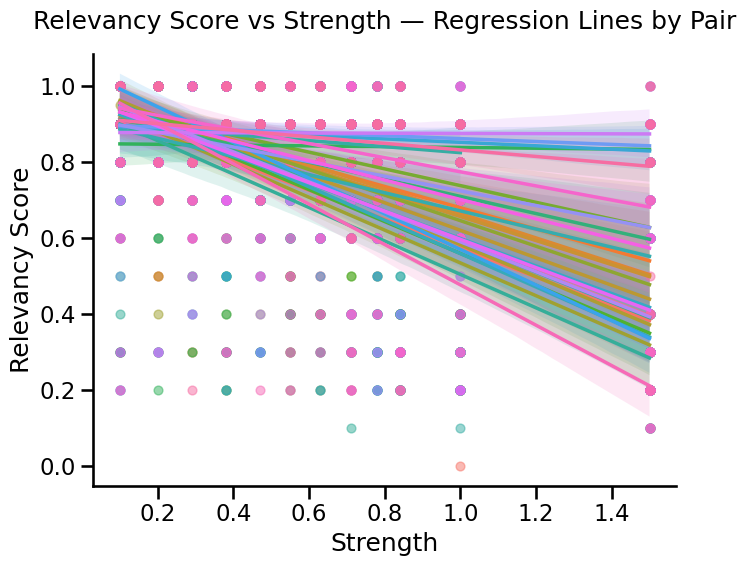

/tmp/ipykernel_49884/2904382795.py:93: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


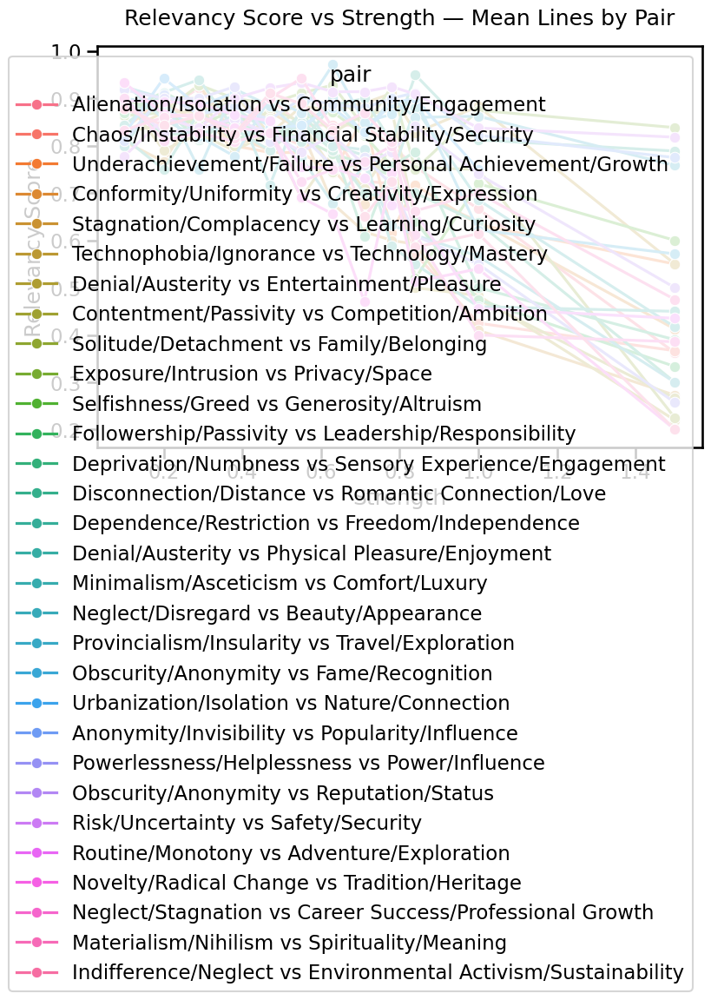

<Figure size 900x600 with 0 Axes>

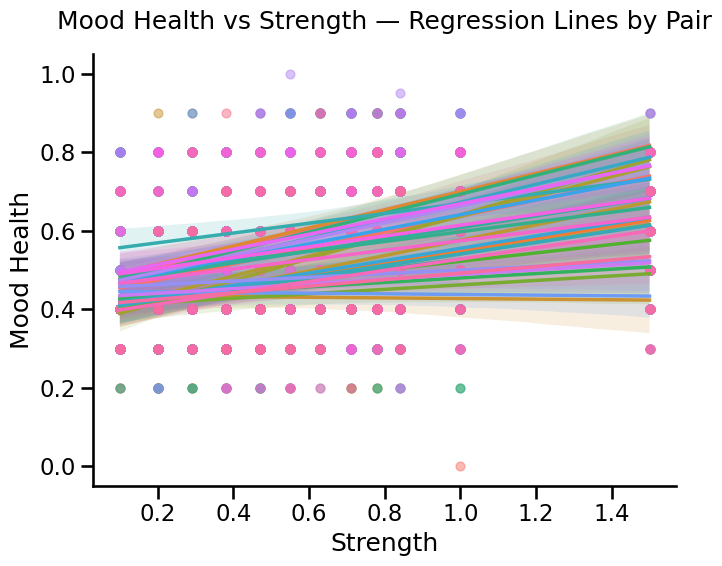

/tmp/ipykernel_49884/2904382795.py:93: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


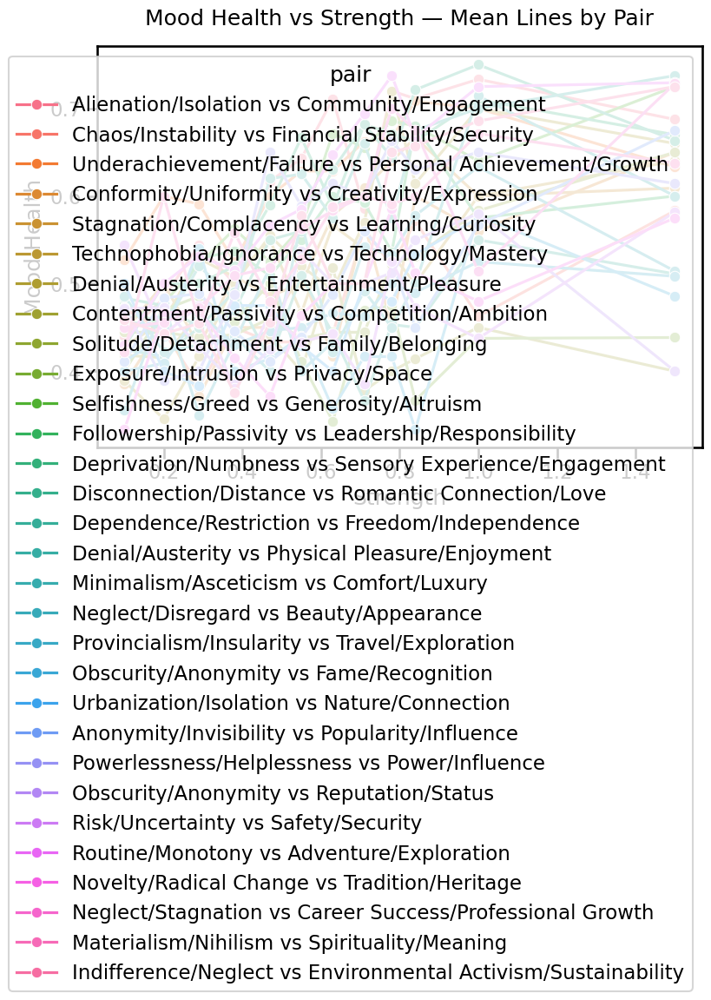

<Figure size 900x600 with 0 Axes>

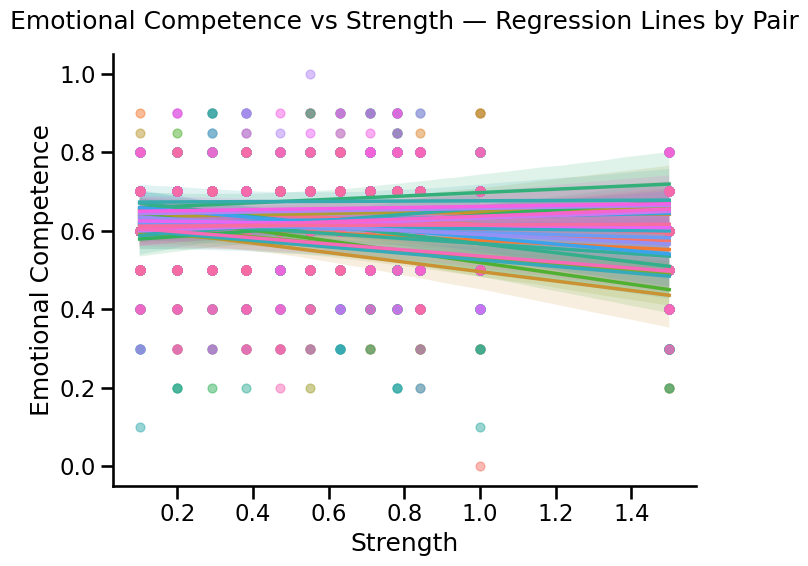

/tmp/ipykernel_49884/2904382795.py:93: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


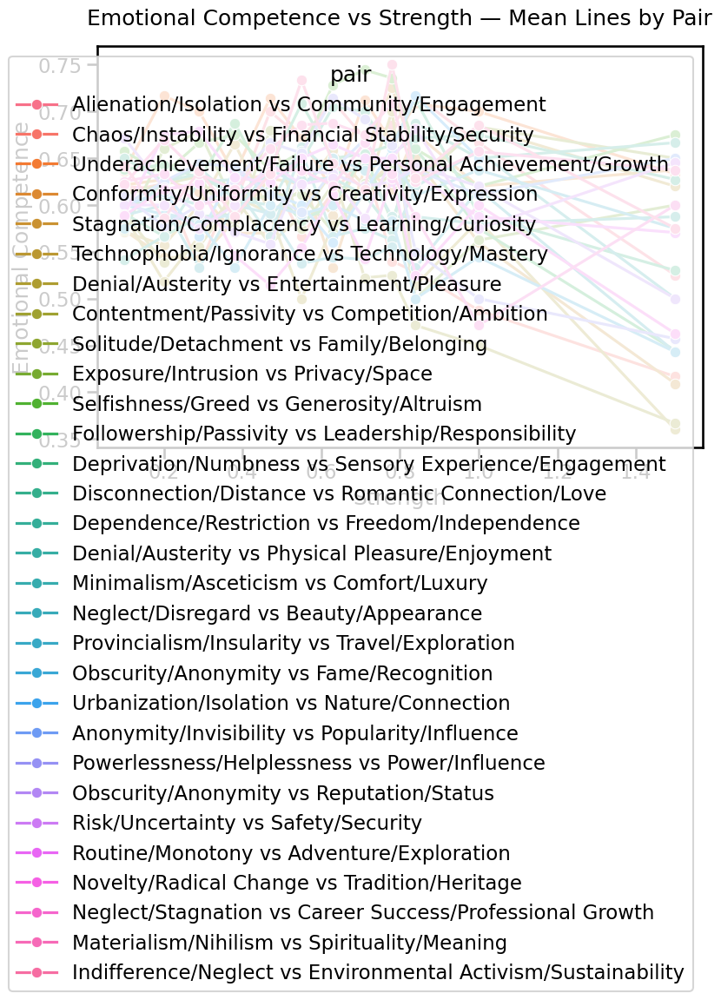

<Figure size 900x600 with 0 Axes>

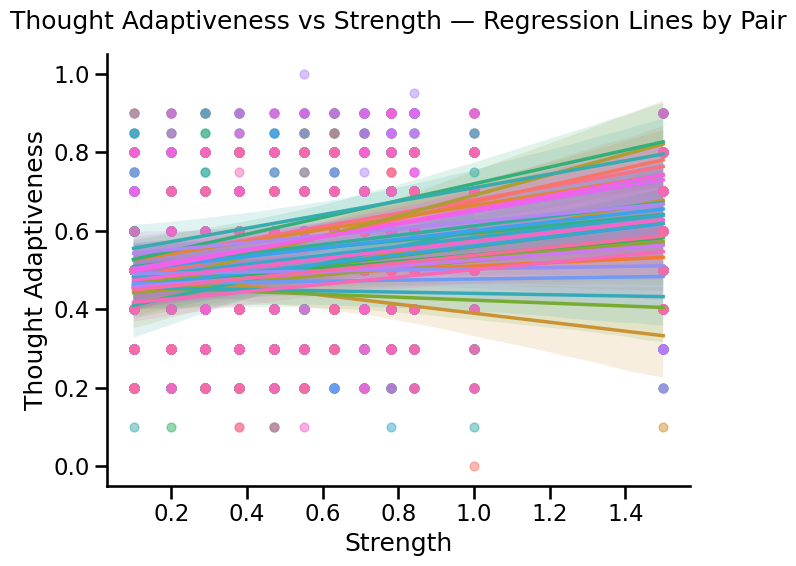

/tmp/ipykernel_49884/2904382795.py:93: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


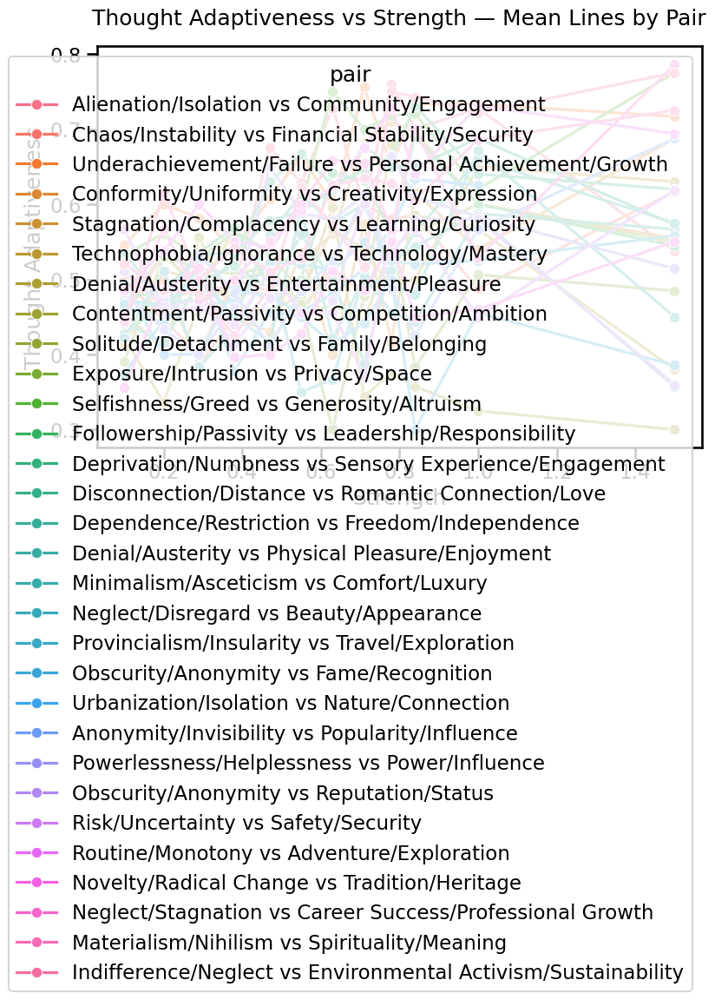

<Figure size 900x600 with 0 Axes>

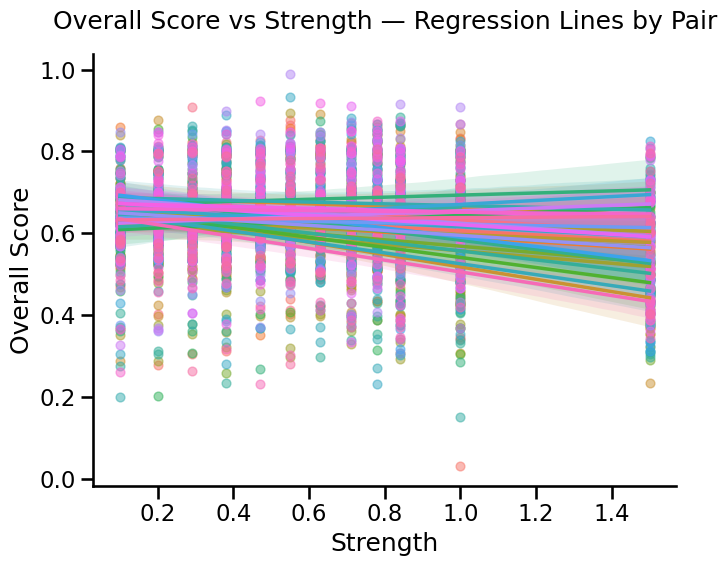

/tmp/ipykernel_49884/2904382795.py:93: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


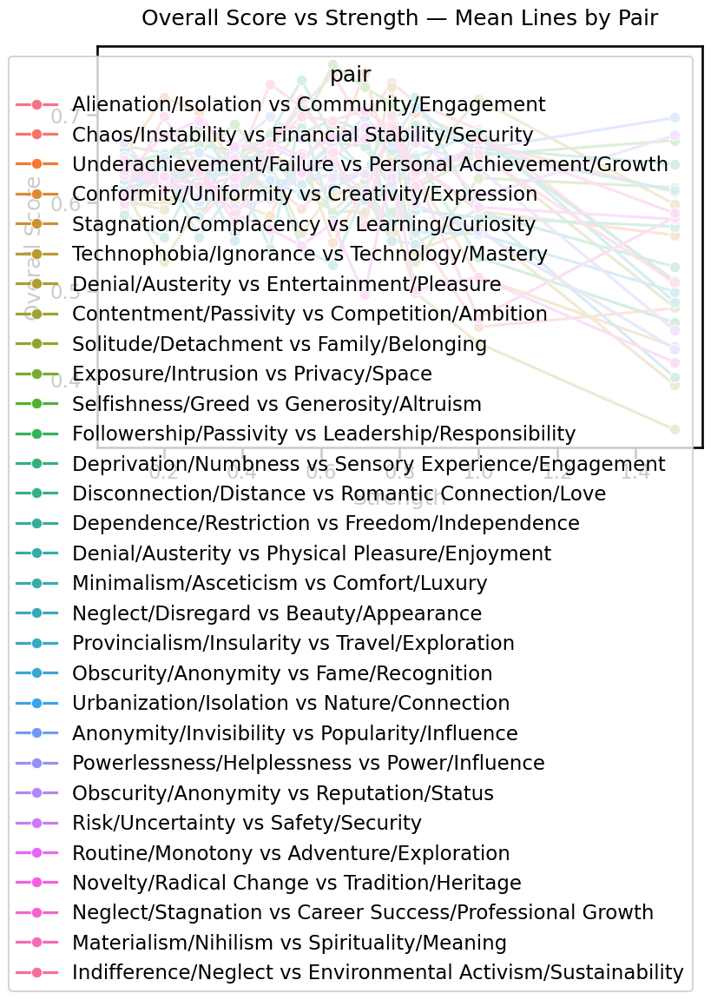

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ── 1. Load data ───────────────────────────────────────────────────────────────
file_path = Path(
    "/home/koalacrown/Desktop/Code/Projects/LLM_threapy/LLM_agumented_therapy/Cogexp/Valence/cognitive_experiment_results007_big_with_questions_evaluated.xlsx"
)
df = pd.read_excel(file_path)

# ── 2. (Re‑)compute the weighted overall score if needed ───────────────────────
if "overall_score" not in df.columns:
    weights = {
        "valence_intensity": 0.5,
        "relevancy_score": 2.0,
        "mood_health": 1.0,
        "emotional_competence": 1.0,
        "thought_adaptiveness": 1.0,
    }
    total_w = sum(weights.values())
    df["overall_score"] = (
        df["valence_intensity"]    * weights["valence_intensity"]
        + df["relevancy_score"]    * weights["relevancy_score"]
        + df["mood_health"]        * weights["mood_health"]
        + df["emotional_competence"]* weights["emotional_competence"]
        + df["thought_adaptiveness"]* weights["thought_adaptiveness"]
    ) / total_w

# ── 3. Metrics to visualise ────────────────────────────────────────────────────
metrics = [
    "valence_intensity",
    "relevancy_score",
    "mood_health",
    "emotional_competence",
    "thought_adaptiveness",
    "overall_score",
]

plt.style.use("default")
sns.set_context("talk")            # slightly larger text
figsize = (9, 6)

# colour palette with enough distinguishable hues for many pairs
palette = sns.color_palette("husl", df["pair"].nunique())

# ── 4. Create two plots per metric ─────────────────────────────────────────────
for metric in metrics:
    nice_name = metric.replace("_", " ").title()

    # 4‑a — OLS regression lines, one per pair
    plt.figure(figsize=figsize)
    sns.lmplot(
        data=df,
        x="strength",
        y=metric,
        hue="pair",
        height=6,
        aspect=1.2,
        ci=95,
        palette=palette,
        scatter_kws={"s": 40, "alpha": 0.5},
        line_kws={"linewidth": 2.5},
        legend=False,          # keeps legend clean; toggle if you need it
    )
    plt.title(f"{nice_name} vs Strength — Regression Lines by Pair", pad=18)
    plt.xlabel("Strength")
    plt.ylabel(nice_name)
    plt.tight_layout()
    plt.show()

    # 4‑b — Simple line plot of means, one profile per pair
    means = (
        df.groupby(["pair", "strength"])[metric]
        .mean()
        .reset_index()
        .sort_values("strength")
    )

    plt.figure(figsize=figsize)
    sns.lineplot(
        data=means,
        x="strength",
        y=metric,
        hue="pair",
        palette=palette,
        marker="o",
        linewidth=2.3,
    )
    plt.title(f"{nice_name} vs Strength — Mean Lines by Pair", pad=18)
    plt.xlabel("Strength")
    plt.ylabel(nice_name)
    plt.tight_layout()
    plt.show()

# ── 5. (Optional) Small‑multiples instead of one crowded plot ──────────────────
# If you have many pairs, uncomment the block below to create a  FacetGrid:
#
# for metric in metrics:
#     g = sns.relplot(
#         data=df,
#         x="strength",
#         y=metric,
#         col="pair",
#         kind="scatter",
#         col_wrap=4,          # 4 plots per row
#         height=3.5,
#         facet_kws=dict(sharey=False),
#     )
#     g.map_dataframe(sns.regplot, x="strength", y=metric, scatter=False, ci=None)
#     g.set_titles("{col_name}")
#     g.fig.suptitle(f"{metric.replace('_', ' ').title()} vs Strength (per Pair)",
#                    y=1.02, fontsize=16)
#     plt.tight_layout()
#     plt.show()
